In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.stats import boxcox

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.stattools import pacf
import statsmodels.api as sm
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.ar_model import AutoReg

from statsmodels.tsa.api import SimpleExpSmoothing, Holt, ExponentialSmoothing
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import ElasticNetCV
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV

from keras.models import Sequential
from keras.layers import Input, Dense, SimpleRNN, LSTM

import itertools

import warnings
warnings.filterwarnings('ignore')

In [2]:
df_train = pd.read_excel('Group_10.xlsx',skiprows=1,index_col=0,sheet_name='project_train_data')
df_train.index=pd.to_datetime(df_train.index)

df_test = pd.read_excel('Group_10.xlsx',skiprows=1,index_col=0,sheet_name='project_test_data')
df_test.index=pd.to_datetime(df_test.index)

column_Names = ['A','B','C','D','E','F','G','H','I','J']

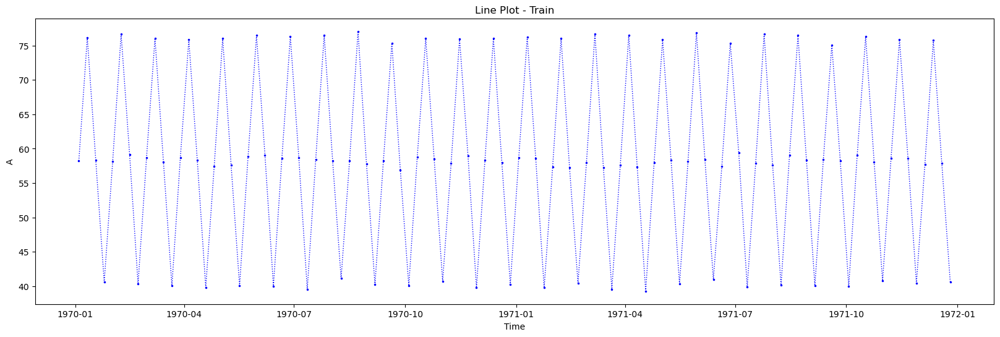

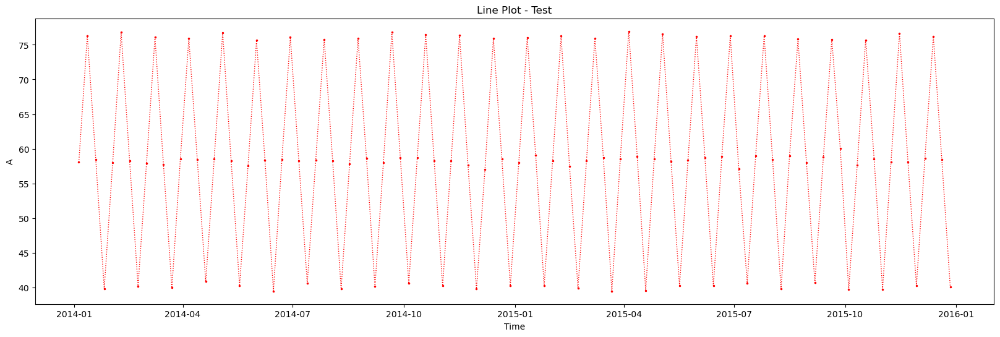

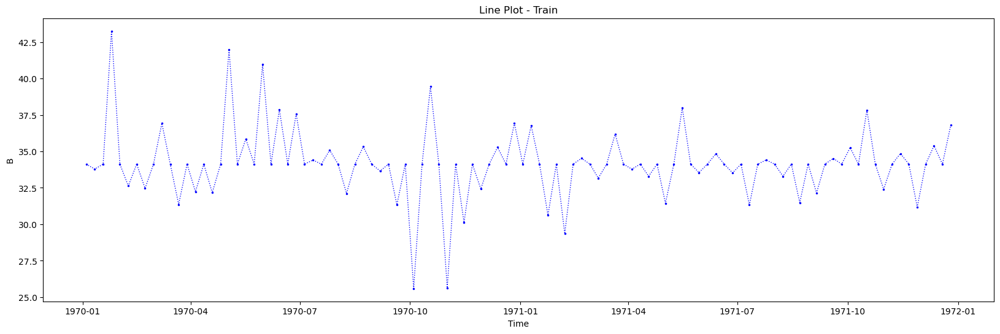

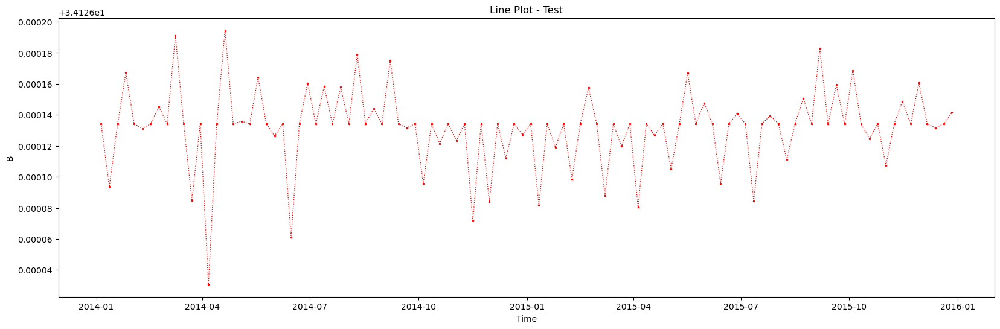

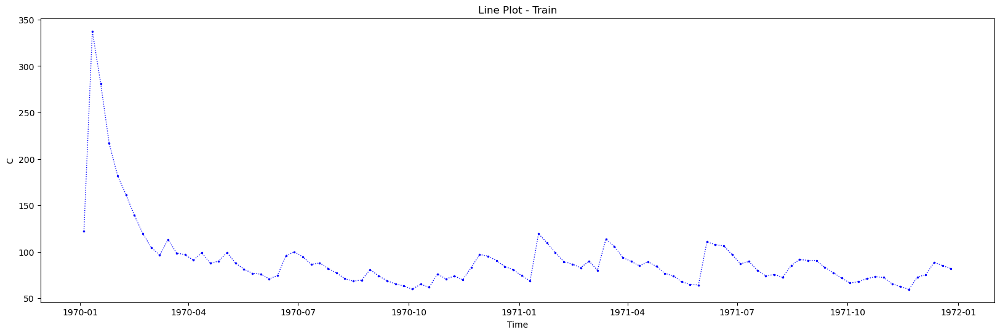

...

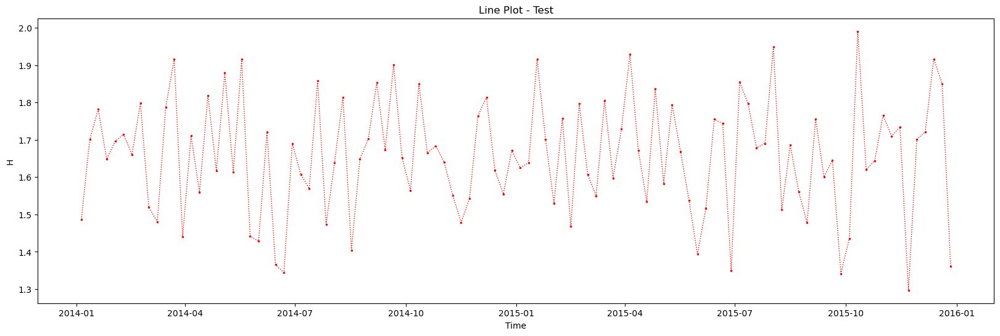

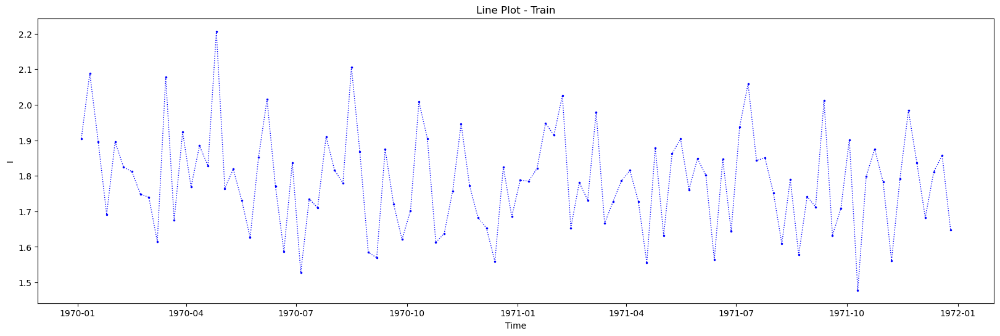

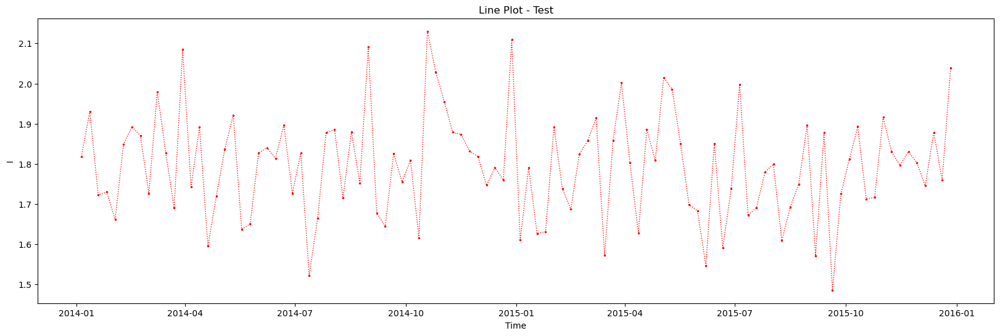

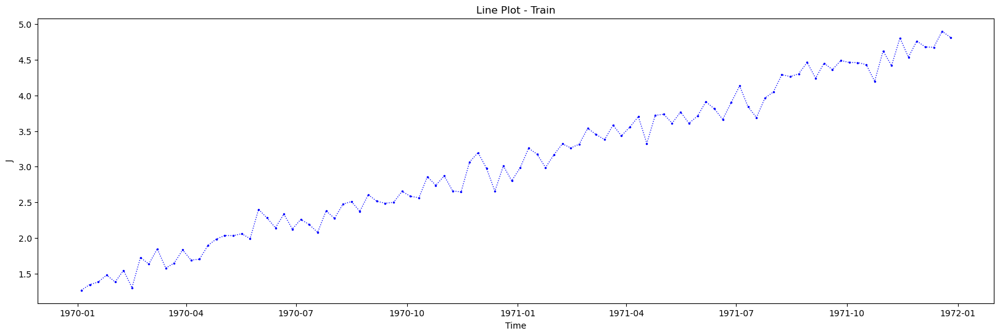

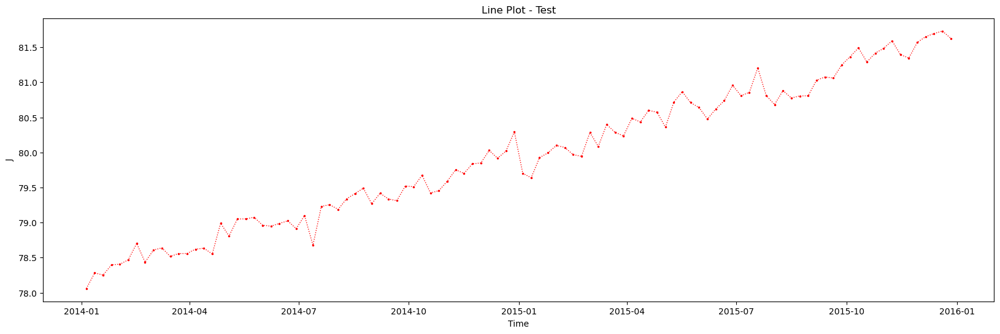

In [3]:
first_two_years = df_train.loc[df_train.index[0]:str(df_train.index[0].year + 1)]
last_two_years = df_train.loc[str(df_train.index[-1].year - 1):df_train.index[-1]]

first_two_years.index=pd.to_datetime(first_two_years.index)
last_two_years.index=pd.to_datetime(last_two_years.index)

for i in column_Names:
    plt.figure(figsize=(20, 6))
    plt.plot(first_two_years[[i]],"b:o", linewidth=1,markersize=1.5)
    plt.title('Line Plot - Train')
    plt.xlabel('Time')
    plt.ylabel(i)
    plt.show()
    
    plt.figure(figsize=(20, 6))
    plt.plot(last_two_years[[i]],"r:o", linewidth=1,markersize=1.5)
    plt.title('Line Plot - Test')
    plt.xlabel('Time')
    plt.ylabel(i)
    plt.show()

# Commentary of Products
# A: It's highly seasonal demand, with consistent performance.
# B: At the start the first two years seems to be decreasing as trend but with the last two years it seems to be stable
# C: The trend in the start is decreasing by a lot, but with the last two years it seems to be stable a little bit. With seasonality it shows a little bit seasonality in both of them with higher number of anomalies in the both of them
# D: It is highly seasonal and value is fluctuate a lot.
# E: The trend in the initial two years shows a gradual decline with noticeable seasonality and regular anomalies, while the last two years indicate a more stable trend with persistent seasonality and a few significant anomalies.
# F: Both the initial two years and the last two years display a stable trend with no clear long-term direction, marked by moderate seasonality and numerous anomalies throughout the periods.
# G: Both the initial two years and the last two years exhibit a stable trend with no clear long-term direction, featuring moderate seasonality and frequent anomalies throughout both periods.
# H: Both the initial two years and the last two years show a stable trend with no clear long-term direction, moderate seasonality, and numerous anomalies throughout both periods.
# I: Both the initial two years and the last two years exhibit a stable trend with no clear long-term direction, moderate seasonality, and frequent anomalies throughout the periods.
# J: Both the initial two years and the last two years display a clear upward trend, with the product value consistently increasing over time, accompanied by moderate seasonality and some anomalies.

'This is first two year of A Column'

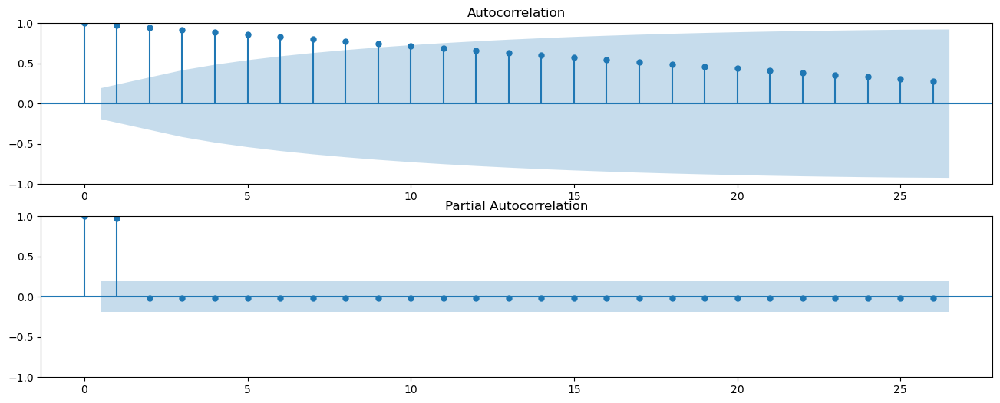

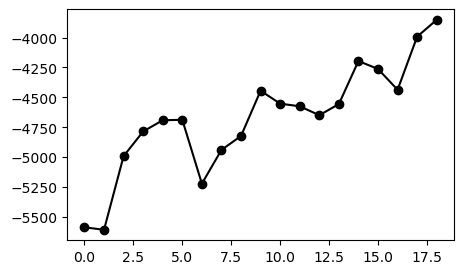

'This is last two year of A Column'

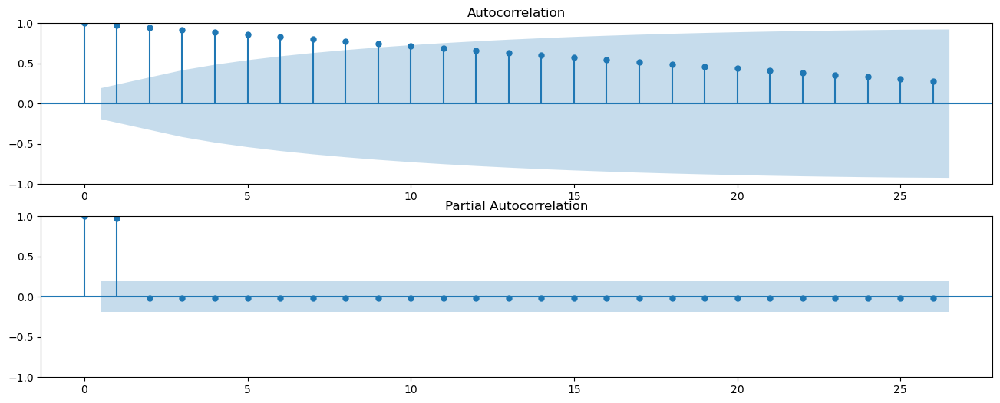

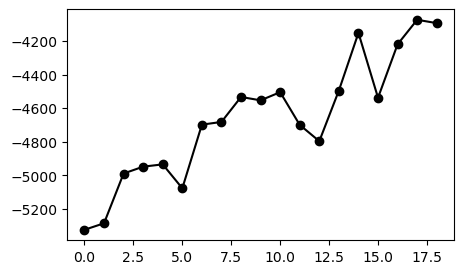

'This is first two year of B Column'

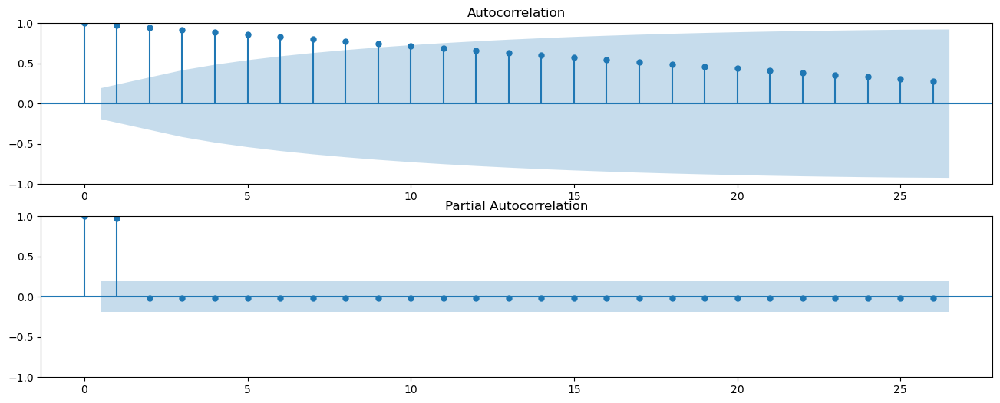

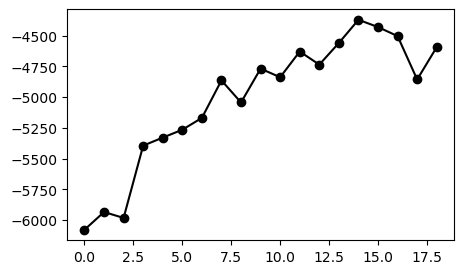

'This is last two year of B Column'

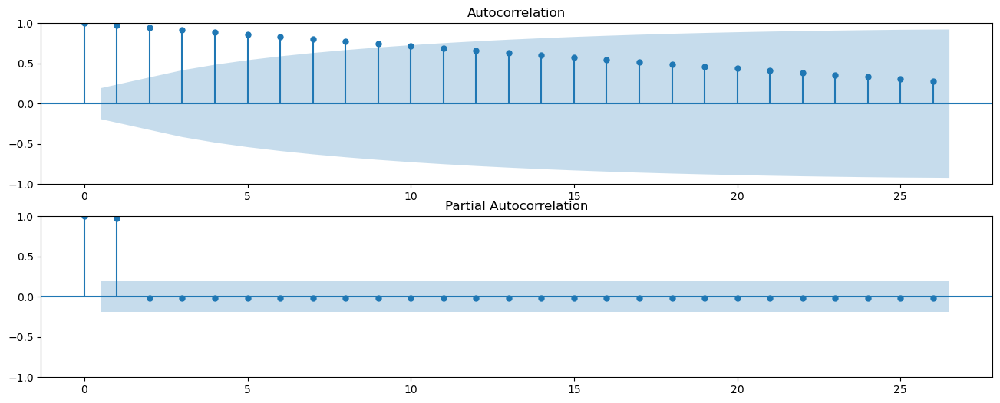

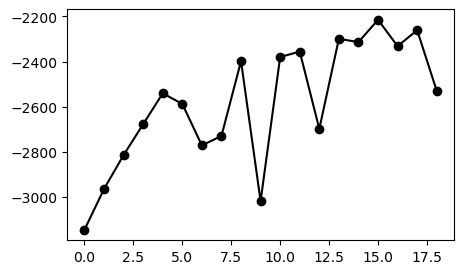

'This is first two year of C Column'

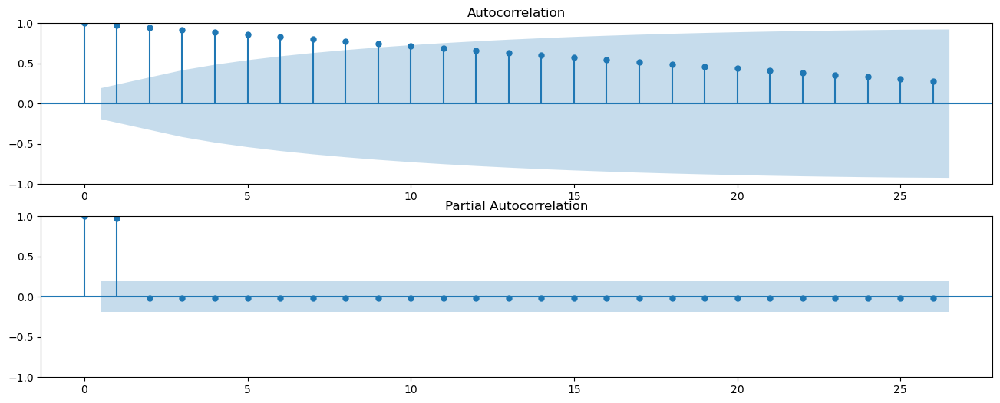

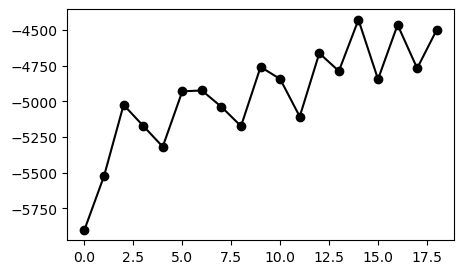

'This is last two year of C Column'

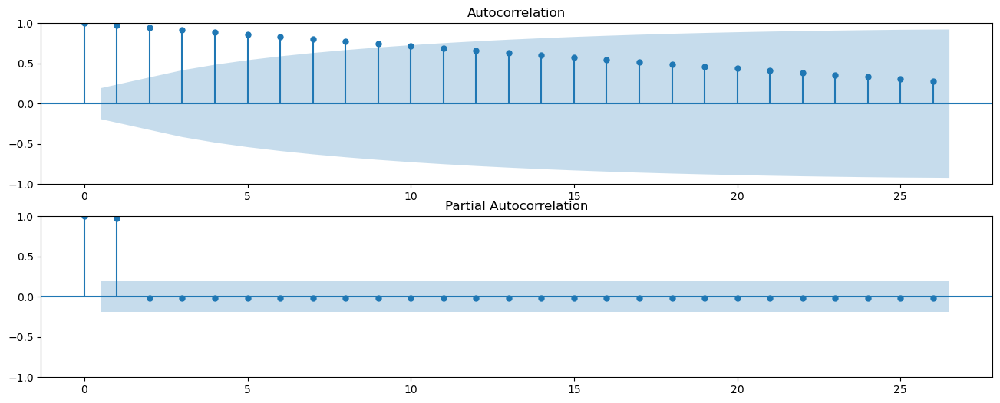

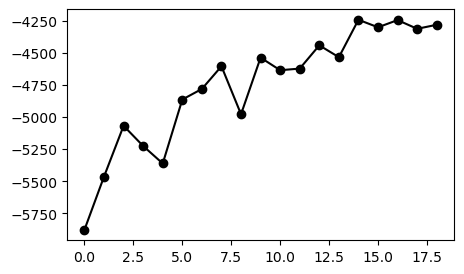

'This is first two year of D Column'

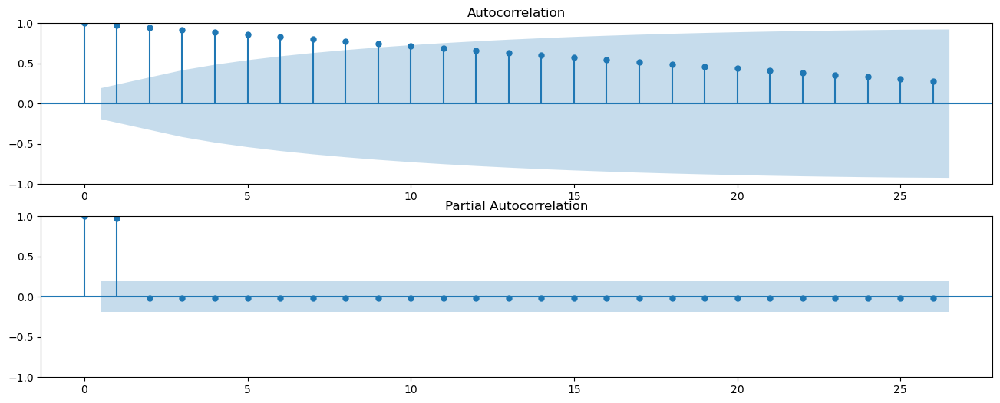

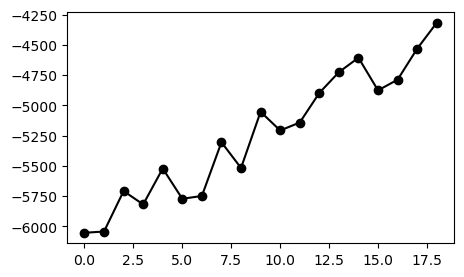

'This is last two year of D Column'

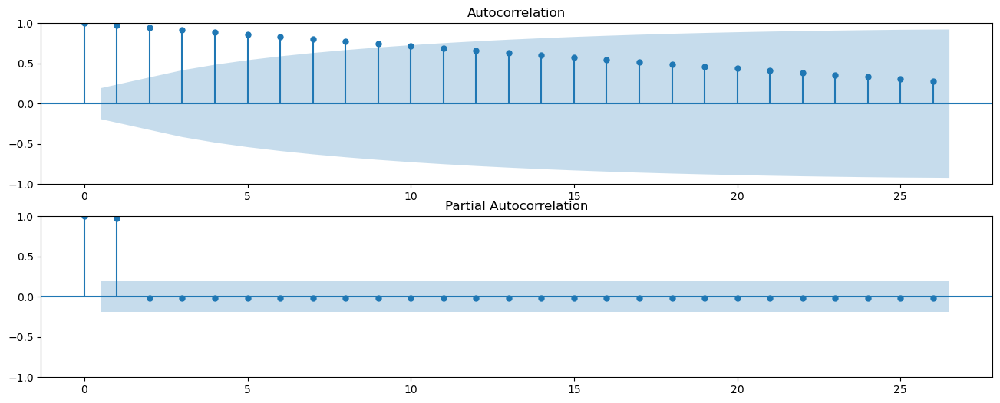

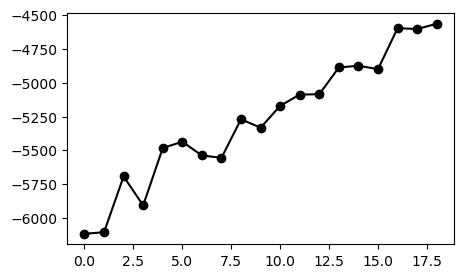

'This is first two year of E Column'

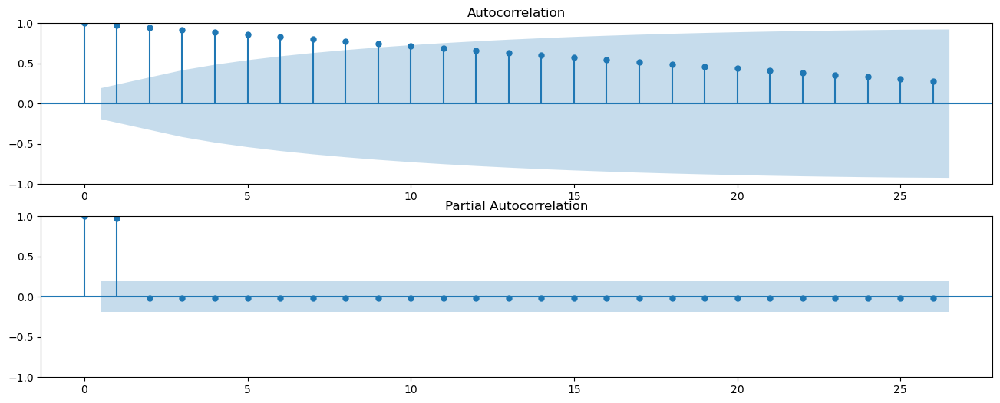

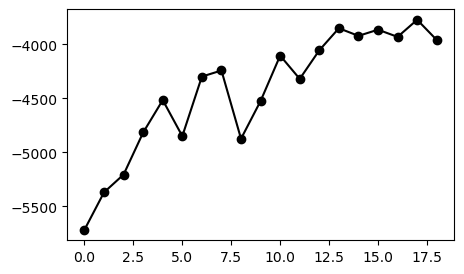

'This is last two year of E Column'

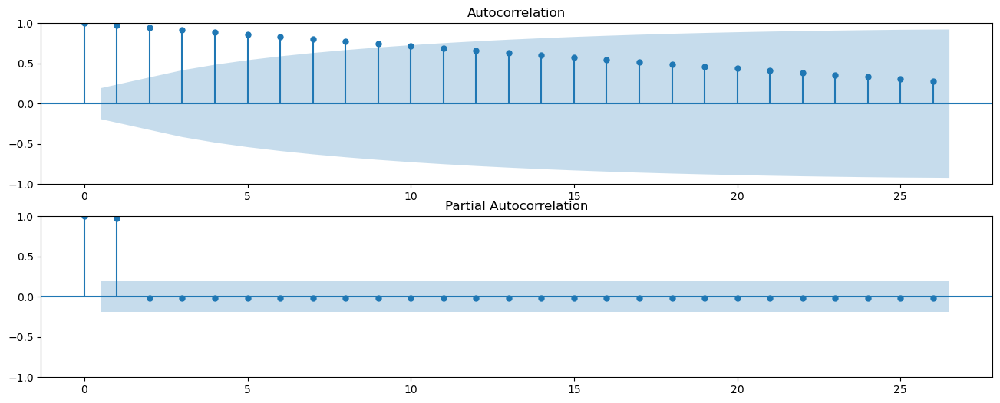

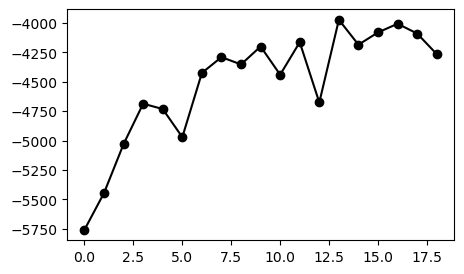

'This is first two year of F Column'

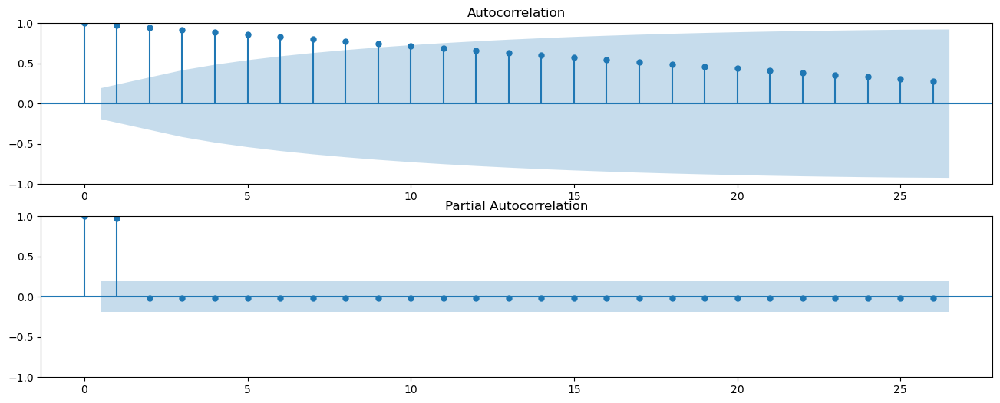

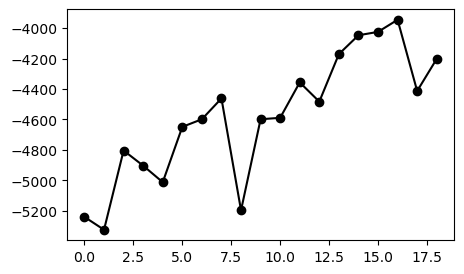

'This is last two year of F Column'

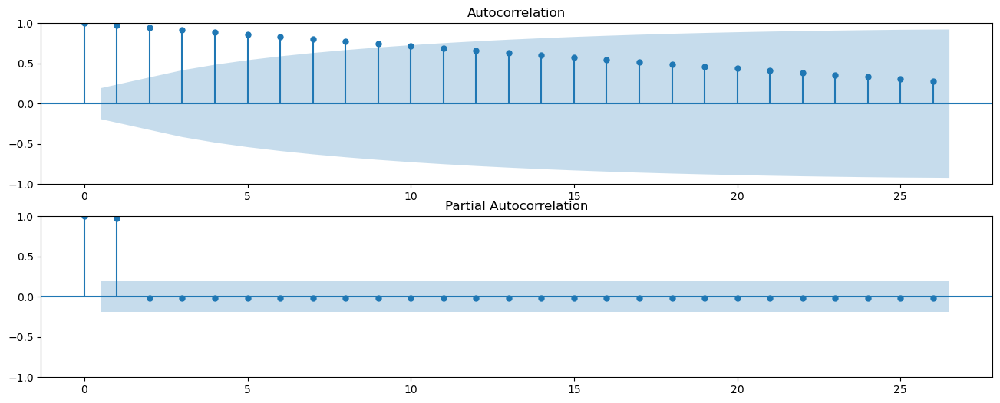

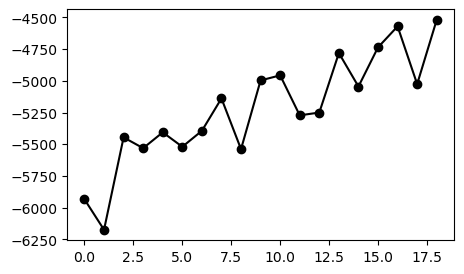

'This is first two year of G Column'

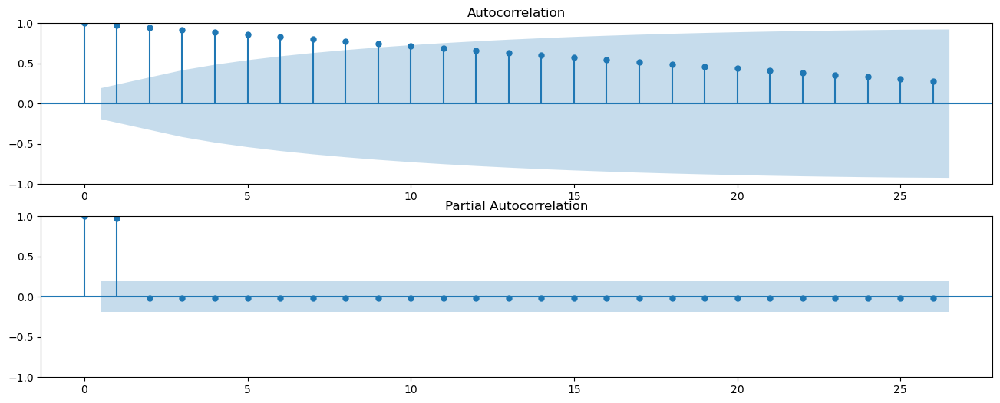

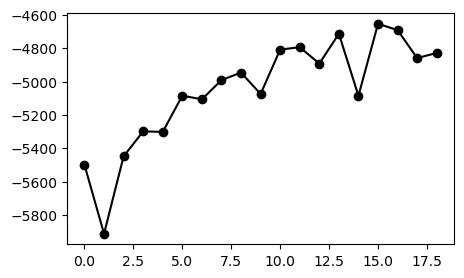

'This is last two year of G Column'

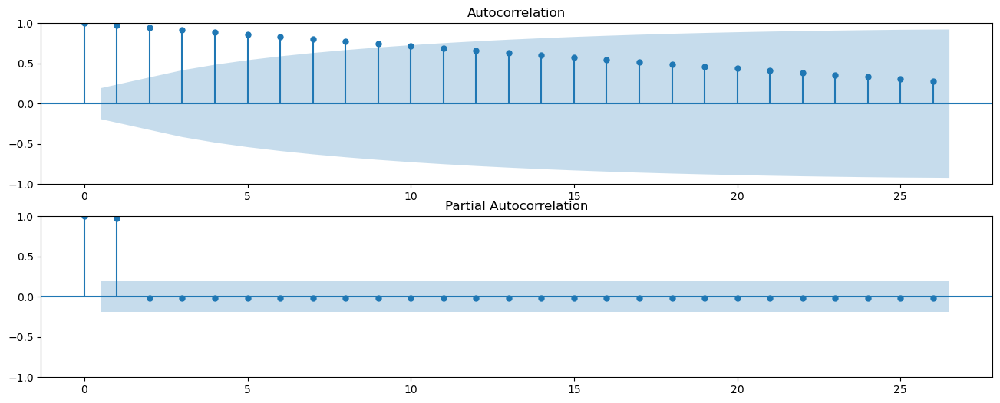

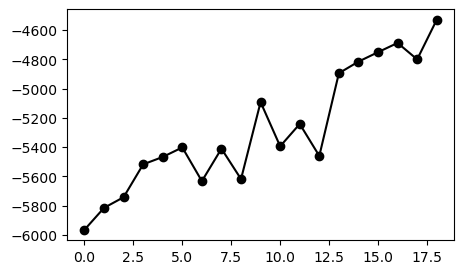

'This is first two year of H Column'

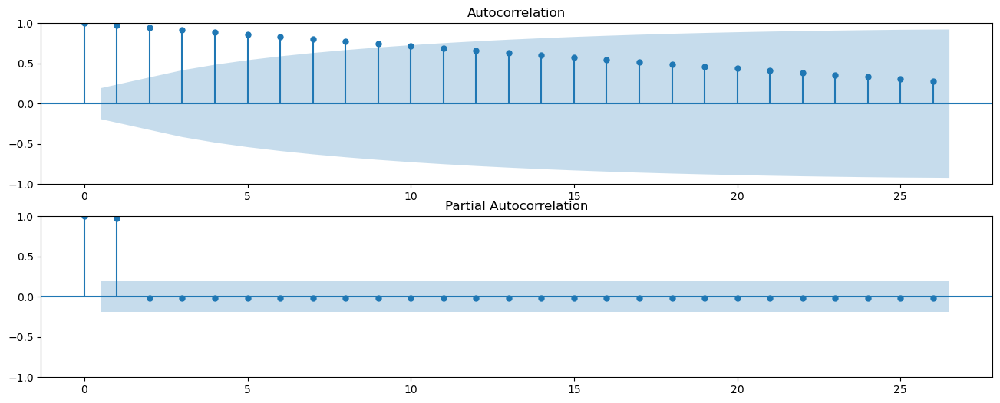

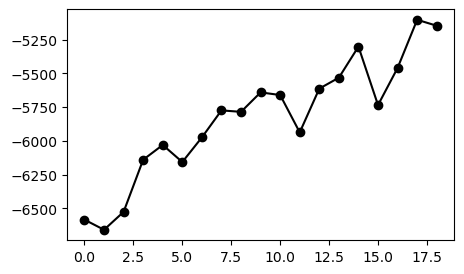

'This is last two year of H Column'

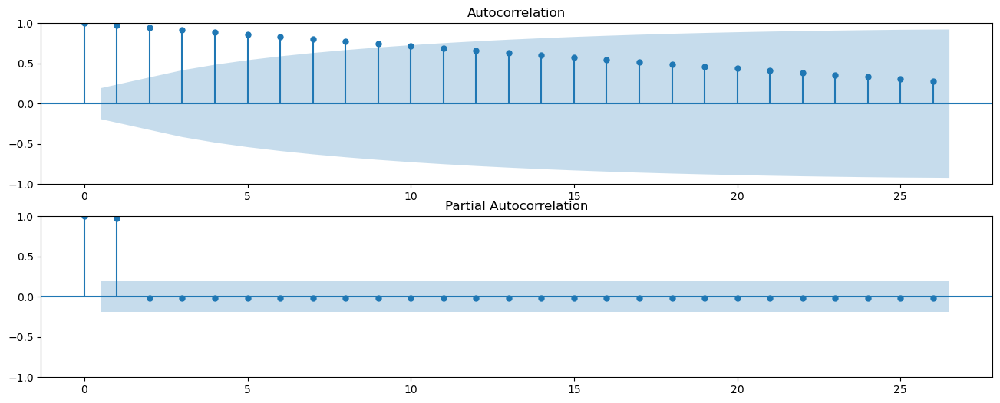

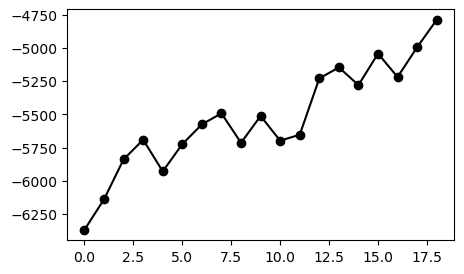

'This is first two year of I Column'

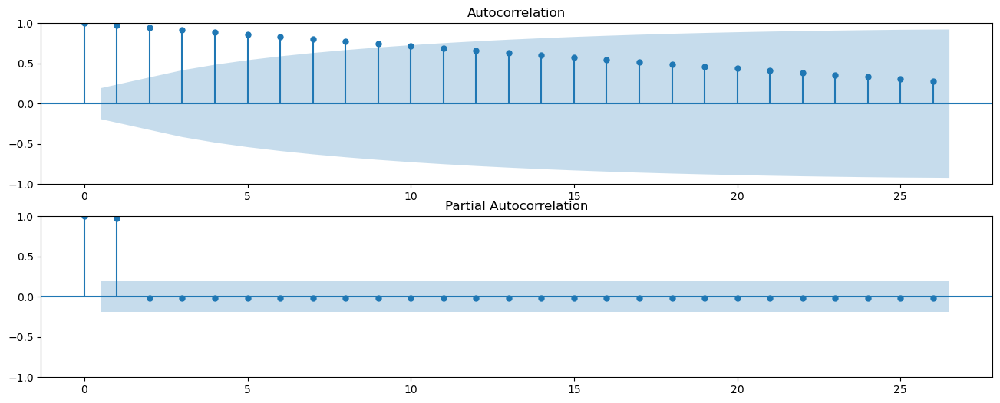

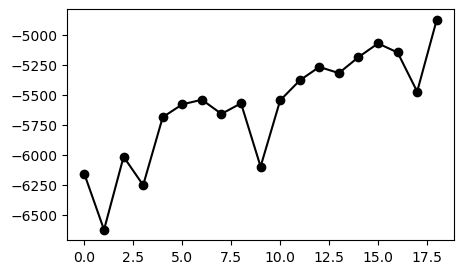

'This is last two year of I Column'

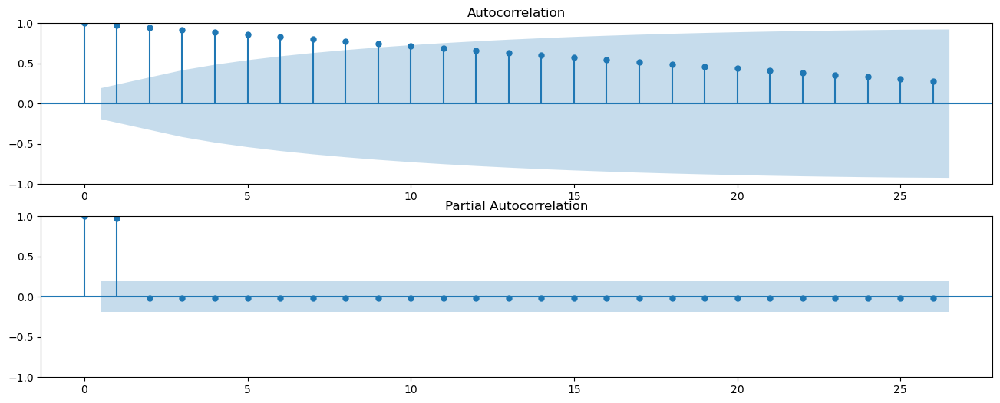

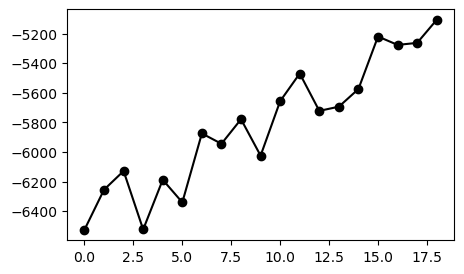

'This is first two year of J Column'

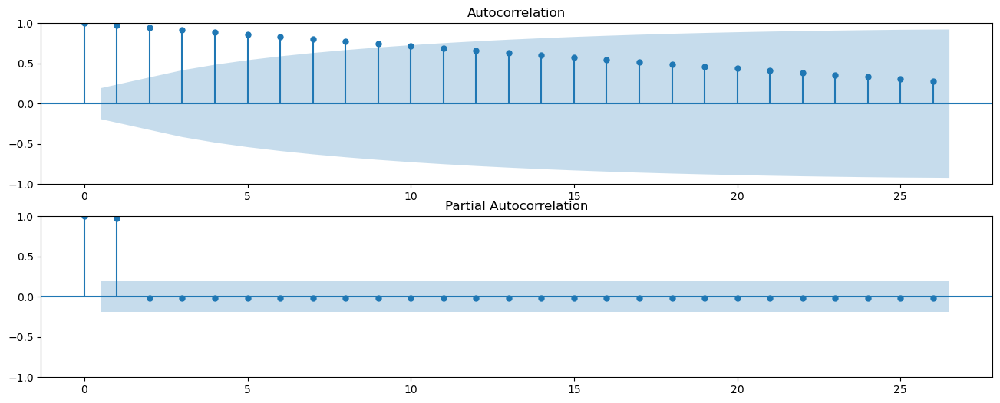

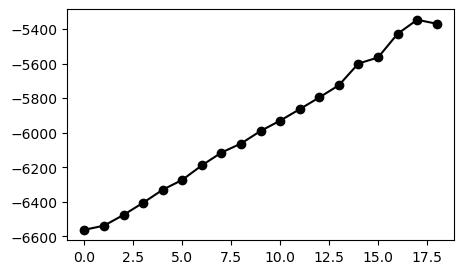

'This is last two year of J Column'

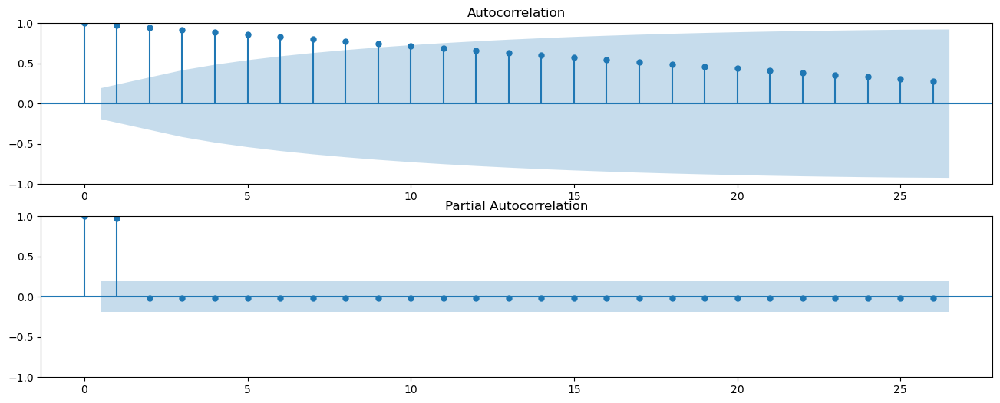

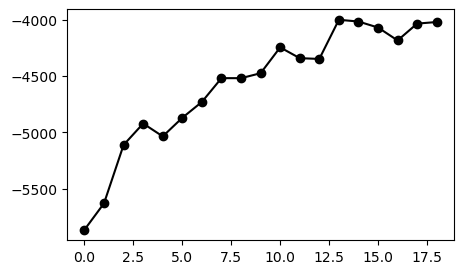

In [4]:
for i in column_Names:
    stl = STL(first_two_years[[i]].squeeze(), seasonal=53)
    ts_dec = stl.fit()
    
    display("This is first two year of " + i + " Column")
    
    fig = plt.figure(figsize=(16, 6))
    ax1 = fig.add_subplot(211)
    fig = sm.graphics.tsa.plot_acf(ts_dec.trend, lags=int(len(ts_dec.trend)/4), ax=ax1)
    ax2 = fig.add_subplot(212)
    fig = sm.graphics.tsa.plot_pacf(ts_dec.trend, lags=int(len(ts_dec.trend)/4), ax=ax2)

    fig = plt.figure(figsize=(5, 3))
    bic_vals=[AutoReg(ts_dec.trend, lags=lag).fit().bic for lag in range(1,20)]
    plt.plot(bic_vals,marker='o',color='k')
    plt.show()
    
    stl = STL(last_two_years[[i]].squeeze(), seasonal=53)
    ts_dec_2 = stl.fit()
    
    display("This is last two year of " + i + " Column")
    
    fig = plt.figure(figsize=(16, 6))
    ax1 = fig.add_subplot(211)
    fig = sm.graphics.tsa.plot_acf(ts_dec_2.trend, lags=int(len(ts_dec_2.trend)/4), ax=ax1)
    ax2 = fig.add_subplot(212)
    fig = sm.graphics.tsa.plot_pacf(ts_dec_2.trend, lags=int(len(ts_dec_2.trend)/4), ax=ax2)

    fig = plt.figure(figsize=(5, 3))
    bic_vals=[AutoReg(ts_dec_2.trend, lags=lag).fit().bic for lag in range(1,20)]
    plt.plot(bic_vals,marker='o',color='k')
    plt.show()

# Interpretation of Prodcuts
# A: The first two years and the last two years both show strong autocorrelation with a gradual decline, while partial autocorrelation highlights significant first-lag correlations, indicating that the product's values are highly dependent on their immediate past values.
# B: Both the initial two years and the last two years show strong autocorrelation with a gradual decline, while partial autocorrelation indicates significant first-lag correlations, suggesting that the product's values are highly dependent on their immediate past values.
# C: Both the initial two years and the last two years exhibit strong autocorrelation with a gradual decline, while partial autocorrelation indicates significant first-lag correlations, highlighting the product's strong dependence on its immediate past values.
# D: Both the initial two years and the last two years exhibit strong autocorrelation with a gradual decline, while partial autocorrelation indicates significant first-lag correlations, highlighting the product's strong dependence on its immediate past values.
# E: Both the initial two years and the last two years show strong autocorrelation with a gradual decline and significant first-lag partial autocorrelation, indicating that the product's values are highly dependent on their immediate past values.
# F: Both the initial two years and the last two years display strong autocorrelation with a gradual decline and significant first-lag partial autocorrelation, indicating that the product's values are highly dependent on their immediate past values.
# G: Both the initial two years and the last two years show strong autocorrelation with a gradual decline and significant first-lag partial autocorrelation, indicating that the product's values are highly dependent on their immediate past values.
# H: Both the initial two years and the last two years display strong autocorrelation with a gradual decline and significant first-lag partial autocorrelation, indicating that the product's values are highly dependent on their immediate past values.
# I: Both the initial two years and the last two years exhibit strong autocorrelation with a gradual decline and significant first-lag partial autocorrelation, indicating that the product's values are highly dependent on their immediate past values.
# J: Both the initial two years and the last two years exhibit strong autocorrelation with a gradual decline and significant first-lag partial autocorrelation, indicating that the product's values are highly dependent on their immediate past values.

==============================Column: A ===================================


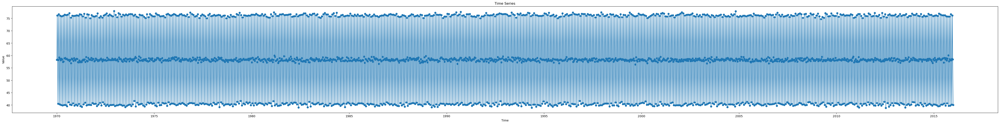

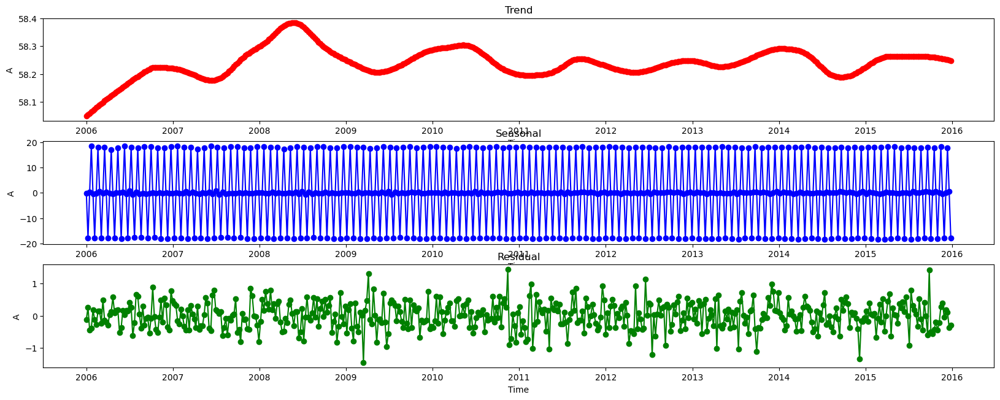

==============================Column: B ===================================


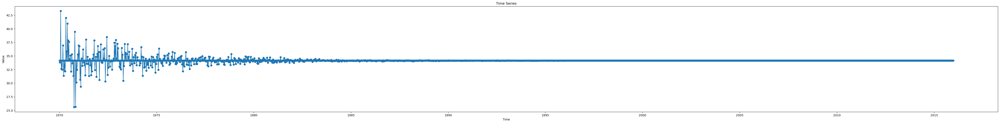

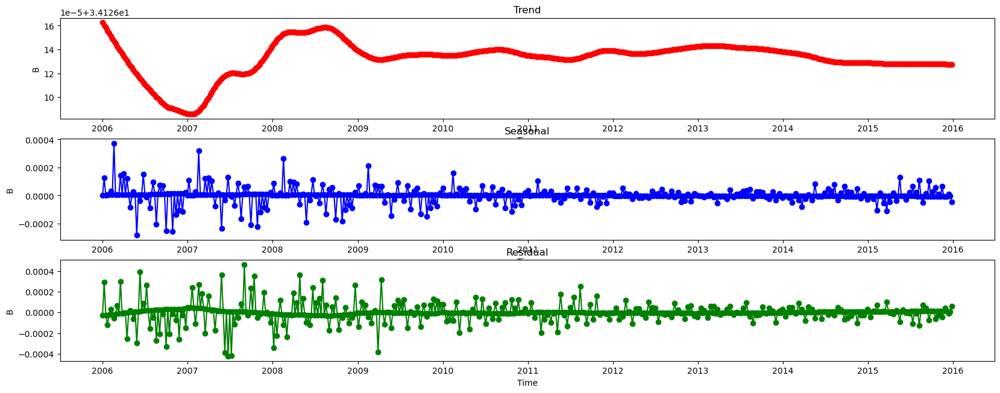

==============================Column: C ===================================


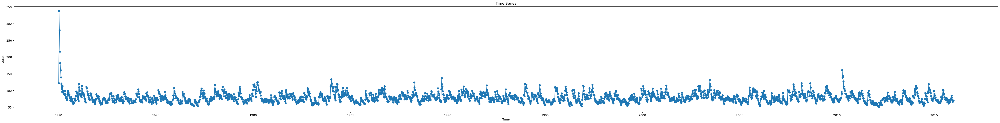

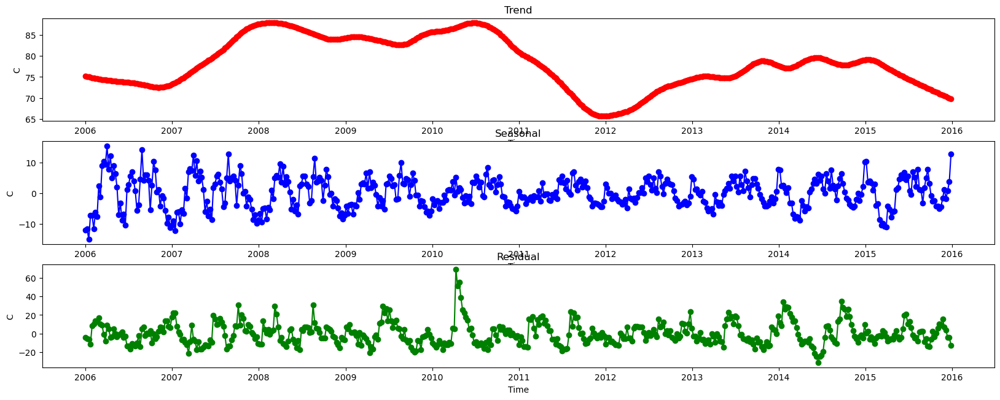

==============================Column: D ===================================


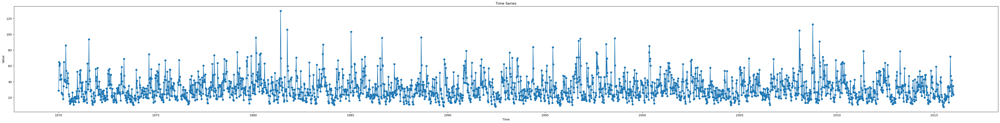

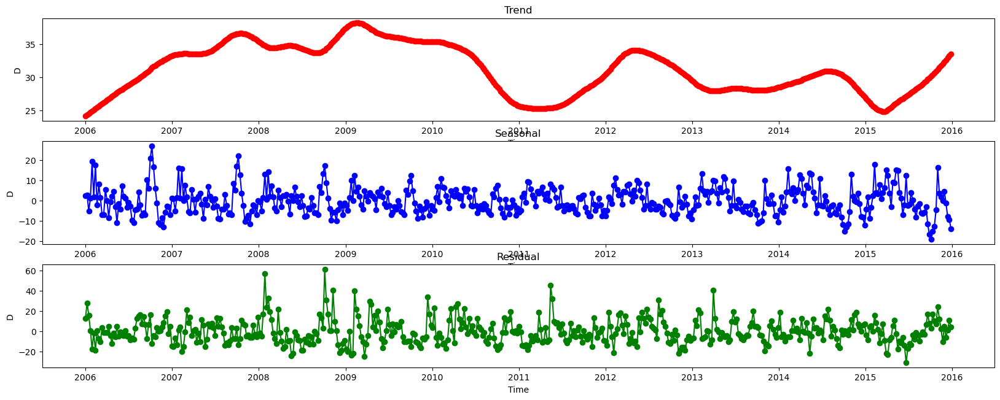

==============================Column: E ===================================


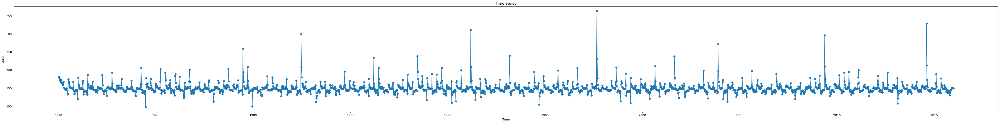

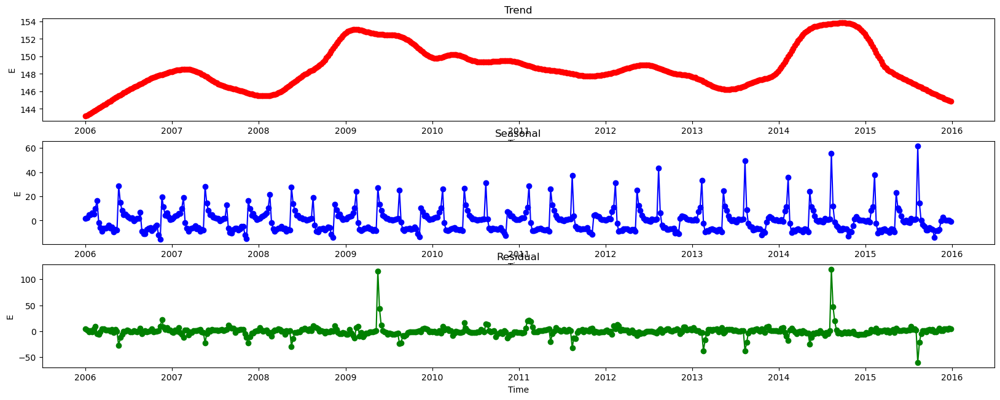

==============================Column: F ===================================


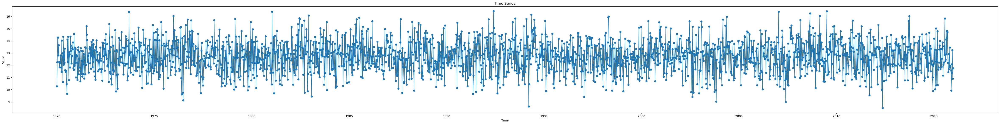

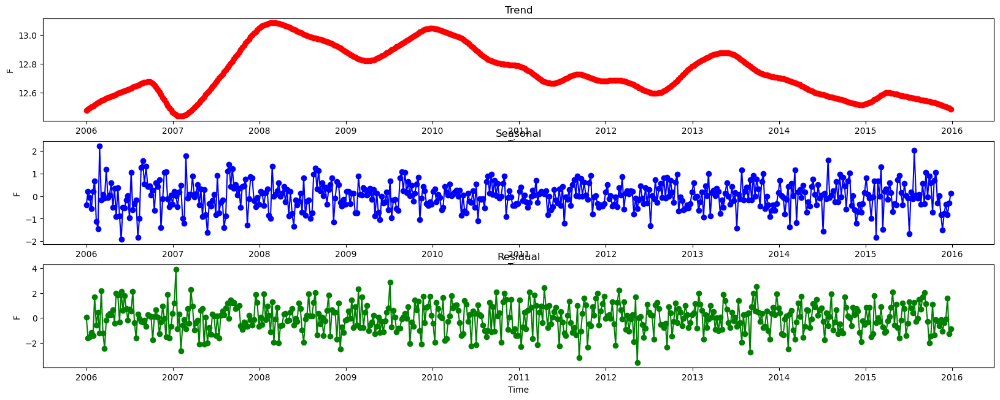

==============================Column: G ===================================


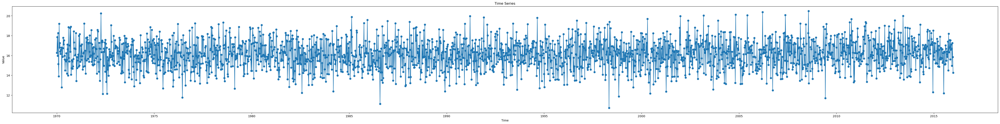

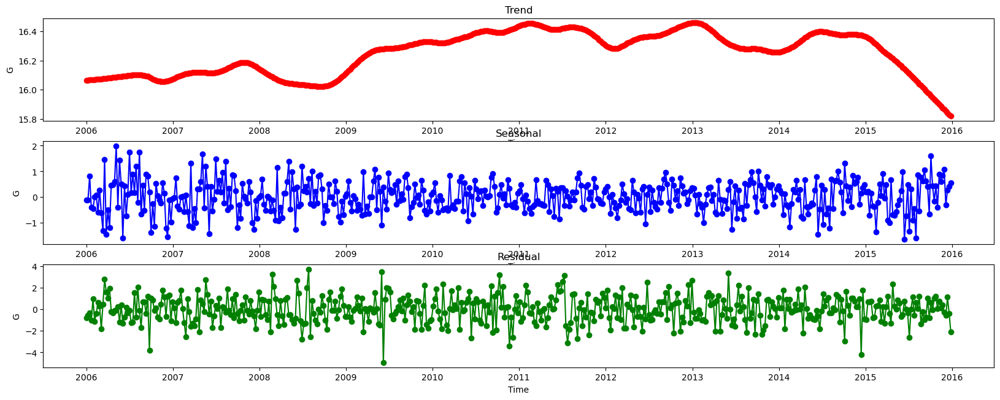

==============================Column: H ===================================


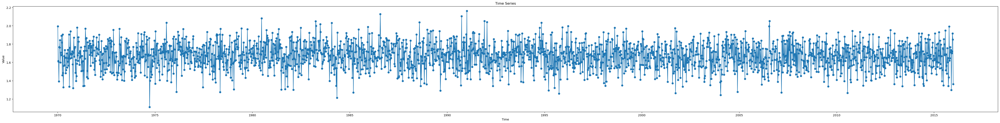

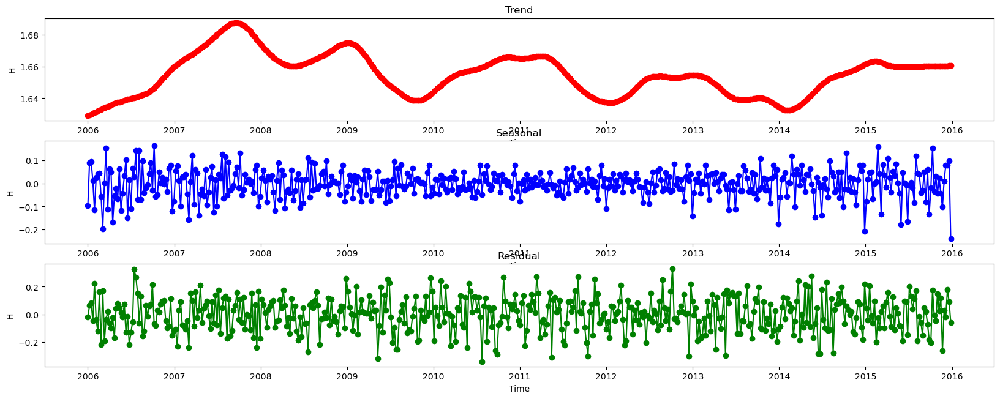

==============================Column: I ===================================


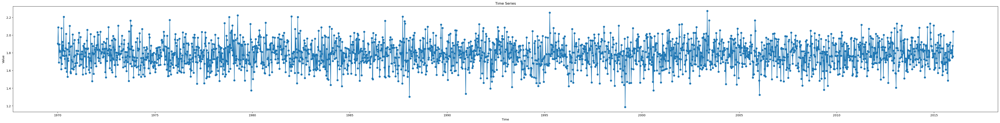

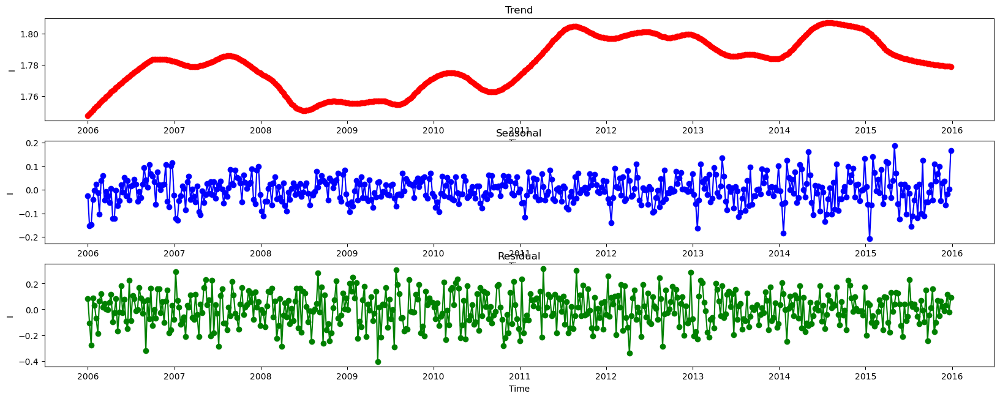

==============================Column: J ===================================


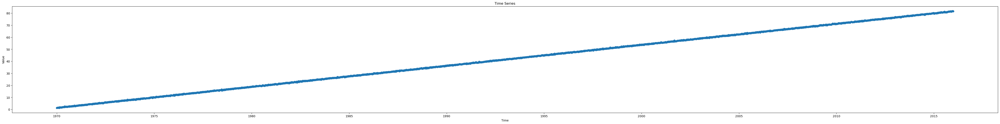

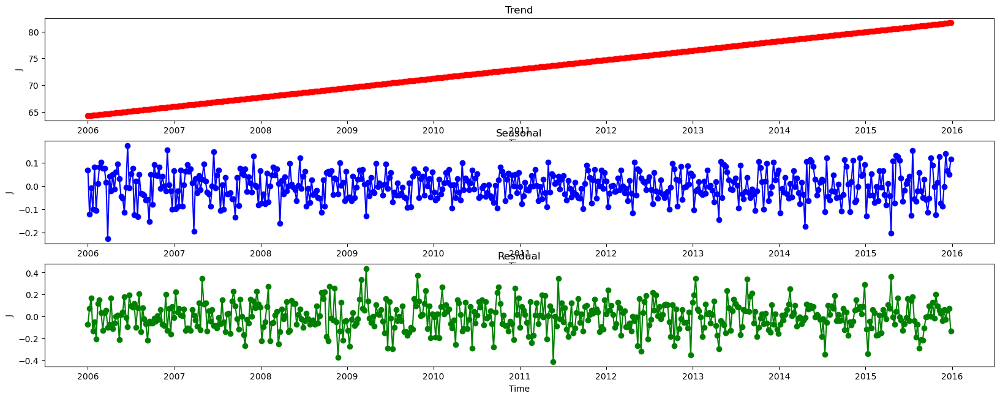

In [5]:
last_ten_years = df_train.loc[str(df_train.index[-1].year - 9):df_train.index[-1]]

for i in column_Names:
    stl = STL(last_ten_years[[i]].squeeze(), seasonal=55)
    ts_dec = stl.fit()
    print('==============================Column:',i,'===================================')
    plt.figure(figsize=(60, 30))
    plt.subplot(4,1,1)
    plt.plot(df_train.index, df_train.loc[:, i].values,marker='o')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.title('Time Series')
    
    plt.figure(figsize=(20, 10))
    plt.subplot(4,1,2)
    plt.plot(ts_dec.trend.index, ts_dec.trend.values,color='r',marker='o')
    plt.xlabel('Time')
    plt.ylabel(i)
    plt.title('Trend')
    
    plt.subplot(4,1,3)
    plt.plot(ts_dec.seasonal.index, ts_dec.seasonal.values,color='b',marker='o')
    plt.xlabel('Time')
    plt.ylabel(i)
    plt.title('Seasonal')
    
    plt.subplot(4,1,4)
    plt.plot(ts_dec.resid.index, ts_dec.resid.values,color='g',marker='o')
    plt.xlabel('Time')
    plt.ylabel(i)
    plt.title('Residual')

    plt.show()


# Comments 
### Column | Additive Or Multiplicative  model?
#### A | Additive 
#### B | Multiplicative  
#### C | Additive 
#### D | Additive 
#### E | It's hard to determine, but we will go with Additive
#### F | Additive 
#### G | Additive 
#### H | Additive 
#### I   | Additive 
#### J  | Additive 


In [6]:
last_ten_years.index=pd.to_datetime(last_ten_years.index)
for i in column_Names:
    tsA = last_ten_years[[i]]
    tsA.dropna(inplace=True)
#     tsA=tsA.asfreq('QS')

    fit1 = SimpleExpSmoothing(tsA).fit(method='least_squares')
    fcast1 = fit1.forecast(5)
    alpha1 = np.round(fit1.params['smoothing_level'],2)

    fit2 = Holt(tsA).fit()
    fcast2 = fit2.forecast(5)
    alpha2 = np.round(fit2.params['smoothing_level'],5)
    kappa2 = np.round(fit2.params['smoothing_trend'],5)


    fit3 = Holt(tsA, damped_trend=True).fit()
    fcast3 = fit3.forecast(5)
    alpha3 = np.round(fit3.params['smoothing_level'],5)
    kappa3 = np.round(fit3.params['smoothing_trend'],5)

    m = 4 # Check how to calculate the m

    fit4 = ExponentialSmoothing(tsA, seasonal_periods=m, trend='add', seasonal='add').fit()
    fcast4 = fit4.forecast(5)
    alpha4=np.round(fit4.params['smoothing_level'],5)
    kappa4=np.round(fit4.params['smoothing_trend'],5)
    gamma4=np.round(fit4.params['smoothing_seasonal'],5)
    phi4=np.round(fit4.params['damping_trend'],5)



    fit5 = ExponentialSmoothing(tsA, seasonal_periods=m, trend='add', seasonal='mul').fit()
    fcast5 = fit5.forecast(5)
    alpha5=np.round(fit5.params['smoothing_level'],5)
    kappa5=np.round(fit5.params['smoothing_trend'],5)
    gamma5=np.round(fit5.params['smoothing_seasonal'],5)
    phi5=np.round(fit5.params['damping_trend'],5)

    fit6 = ExponentialSmoothing(tsA, seasonal_periods=m, trend='add', seasonal='add', damped_trend=True).fit()
    fcast6 = fit6.forecast(5)
    alpha6=np.round(fit6.params['smoothing_level'],5)
    kappa6=np.round(fit6.params['smoothing_trend'],5)
    gamma6=np.round(fit6.params['smoothing_seasonal'],5)
    phi6=np.round(fit6.params['damping_trend'],5)

    fit7 = ExponentialSmoothing(tsA, seasonal_periods=m, trend='add', seasonal='mul', damped_trend=True).fit()
    fcast7 = fit7.forecast(5)
    alpha7=np.round(fit7.params['smoothing_level'],5)
    kappa7=np.round(fit7.params['smoothing_trend'],5)
    gamma7=np.round(fit7.params['smoothing_seasonal'],5)
    phi7=np.round(fit7.params['damping_trend'],5)

    fit8 = ExponentialSmoothing(tsA, seasonal_periods=m, trend=None, seasonal='add').fit()
    fcast8 = fit8.forecast(5)
    alpha8=np.round(fit8.params['smoothing_level'],5)
    kappa8=np.round(fit8.params['smoothing_trend'],5)
    gamma8=np.round(fit8.params['smoothing_seasonal'],5)
    phi8=np.round(fit8.params['damping_trend'],5)

    fit9 = ExponentialSmoothing(tsA, seasonal_periods=m, trend=None, seasonal='mul').fit()
    fcast9 = fit9.forecast(5)
    alpha9=np.round(fit9.params['smoothing_level'],5)
    kappa9=np.round(fit9.params['smoothing_trend'],5)
    gamma9=np.round(fit9.params['smoothing_seasonal'],5)
    phi9=np.round(fit9.params['damping_trend'],5)
    
    models = {'(N,N)':[fit1,alpha1],
              '(A,N)':[fit2,alpha2,kappa2],
              '(D,N)':[fit3,alpha3,kappa3],
              '(A,A)':[fit4,alpha4,kappa4,gamma4,phi4],
              '(A,M)':[fit5,alpha5,kappa5,gamma5,phi5],
              '(D,A)':[fit6,alpha6,kappa6,gamma6,phi6],
              '(D,M)':[fit7,alpha7,kappa7,gamma7,phi7],
              '(N,A)':[fit8,alpha8,kappa8,gamma8,phi8],
              '(N,M)':[fit9,alpha9,kappa9,gamma9,phi9]
             }
    
    
    best_model= dict(sorted(models.items(), key=lambda item: item[1][0].aic)[:1])
    
    print(f"The best model for column '{i}'")
    params_name = ['alpha','kappa','gamma','phi']
    for index, (key, value) in enumerate(best_model.items(), start=1):
        paramaters_model = ''
        for i in range(1,len(value)):
            paramaters_model += str(params_name[i-1]) +" = " + str(value[i]) + ", "
        print(f"""{key} with aic = {value[0].aic} and paramaters = {paramaters_model} """)

The best model for column 'A'
(N,A) with aic = -736.0952392937646 and paramaters = alpha = 0.0, kappa = nan, gamma = 0.0, phi = nan,  
The best model for column 'B'
(N,N) with aic = -9503.237153199203 and paramaters = alpha = 0.0,  
The best model for column 'C'
(N,N) with aic = 2285.708095815984 and paramaters = alpha = 0.81,  
The best model for column 'D'
(N,N) with aic = 2687.2620598416993 and paramaters = alpha = 0.51,  
The best model for column 'E'
(N,N) with aic = 2790.839398425128 and paramaters = alpha = 0.42,  
The best model for column 'F'
(N,M) with aic = 279.0559033956108 and paramaters = alpha = 0.0, kappa = nan, gamma = 0.0, phi = nan,  
The best model for column 'G'
(D,N) with aic = 359.02271041564086 and paramaters = alpha = 0.0, kappa = 0.0,  
The best model for column 'H'
(N,M) with aic = -2041.4475645501107 and paramaters = alpha = 0.0, kappa = nan, gamma = 0.0, phi = nan,  
The best model for column 'I'
(N,N) with aic = -2035.2125417070904 and paramaters = alpha =

In [7]:
for i in column_Names:
    df_train_arima=last_ten_years[[i]].squeeze()
    df_train_arima=df_train_arima.asfreq('W')
    nts_train=df_train_arima.rolling(5).mean()
    
    p_values = range(0, 8)  
    d_values = range(0, 3) 
    q_values = range(0, 3)  

    pdq = list(itertools.product(p_values, d_values, q_values))

    best_aic = np.inf
    best_pdq = None
    best_coeff = None

    for param in pdq:
        try:
            model = sm.tsa.ARIMA(nts_train, order=param).fit()
            aic = model.aic

            if aic < best_aic:
                best_aic = aic
                best_pdq = param
                best_coeff = model.params

        except:
            print(f'Could not converge/solve case {param}')
            continue
    
    print(f"Column '{i}'")
    print("Best AIC:", best_aic)
    print("Best (p, d, q):", best_pdq)

Column 'A'
Best AIC: -550.8326662479645
Best (p, d, q): (7, 1, 2)
Column 'B'
Best AIC: -9434.031092910507
Best (p, d, q): (7, 0, 0)
Column 'C'
Best AIC: 2184.0028901565584
Best (p, d, q): (7, 0, 2)
Column 'D'
Best AIC: 2530.306014167354
Best (p, d, q): (7, 0, 2)
Column 'E'
Best AIC: 2615.6043482053938
Best (p, d, q): (7, 0, 2)
Column 'F'
Best AIC: 10.0
Best (p, d, q): (2, 0, 1)
Column 'G'
Best AIC: 283.11723189425834
Best (p, d, q): (7, 0, 2)
Column 'H'
Best AIC: -2055.2209146686264
Best (p, d, q): (7, 0, 0)
Column 'I'
Best AIC: -2056.361286685105
Best (p, d, q): (6, 0, 0)
Column 'J'
Best AIC: -1939.3486032230758
Best (p, d, q): (7, 1, 2)


In [8]:
def time_delay_embedding(series, embedding_dimension, time_delay):
    n = len(series)
    embedding_size = n - (embedding_dimension - 1) * time_delay
    embedding = np.zeros((embedding_size, embedding_dimension))

    for i in range(embedding_size):
        for j in range(embedding_dimension):
            embedding[i, j] = series[i + j * time_delay]

    return embedding

window = 5

for i in column_Names:
    print(f"This is column: {i}")
    ts_train_f = df_train[[i]].squeeze()
    ts_train_f=ts_train_f.asfreq('W')



    X_train_g = time_delay_embedding(ts_train_f,window, 1)[:-1]
    y_train_g = ts_train_f[window:]

    svr  = SVR(kernel='linear')
    svr .fit(X_train_g, y_train_g)
    
    print("Best parameters SVR:", svr.get_params())
    
    rnn = Sequential()
    rnn.add(Input(shape=(window,1)))
    rnn.add(SimpleRNN(50,activation='linear'))  
    rnn.add(Dense(1, activation='linear'))
    rnn.compile(loss='mean_squared_error', optimizer='adam')
    rnn.fit(X_train_g, y_train_g, epochs=50,verbose=0)
    
    lst = Sequential()
    lst.add(Input(shape=(window,1)))
    lst.add(LSTM(50, activation='linear'))
    lst.add(Dense(1, activation='linear'))
    lst.compile(loss='mean_squared_error', optimizer='adam')
    lst.fit(X_train_g, y_train_g,epochs=50, verbose=0)
    

This is column: A
Best parameters SVR: {'C': 1.0, 'cache_size': 200, 'coef0': 0.0, 'degree': 3, 'epsilon': 0.1, 'gamma': 'scale', 'kernel': 'linear', 'max_iter': -1, 'shrinking': True, 'tol': 0.001, 'verbose': False}
This is column: B
Best parameters SVR: {'C': 1.0, 'cache_size': 200, 'coef0': 0.0, 'degree': 3, 'epsilon': 0.1, 'gamma': 'scale', 'kernel': 'linear', 'max_iter': -1, 'shrinking': True, 'tol': 0.001, 'verbose': False}
This is column: C
Best parameters SVR: {'C': 1.0, 'cache_size': 200, 'coef0': 0.0, 'degree': 3, 'epsilon': 0.1, 'gamma': 'scale', 'kernel': 'linear', 'max_iter': -1, 'shrinking': True, 'tol': 0.001, 'verbose': False}
This is column: D
Best parameters SVR: {'C': 1.0, 'cache_size': 200, 'coef0': 0.0, 'degree': 3, 'epsilon': 0.1, 'gamma': 'scale', 'kernel': 'linear', 'max_iter': -1, 'shrinking': True, 'tol': 0.001, 'verbose': False}
This is column: E
Best parameters SVR: {'C': 1.0, 'cache_size': 200, 'coef0': 0.0, 'degree': 3, 'epsilon': 0.1, 'gamma': 'scale', 'k